<a href="https://colab.research.google.com/github/Ankita5051/Industrial-Defect-Detection/blob/main/Anomaly_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import Libraries and Dataset
import torch
from pathlib import Path
import numpy as np
import os, shutil
import matplotlib.pyplot as plt

from PIL import Image

from tqdm.auto import tqdm

import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms
import torch.optim as optim

from torchvision.models import resnet50, ResNet50_Weights
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download ipythonx/mvtec-ad

Dataset URL: https://www.kaggle.com/datasets/ipythonx/mvtec-ad
License(s): copyright-authors
100% 4.91G/4.91G [00:48<00:00, 240MB/s]
100% 4.91G/4.91G [00:48<00:00, 110MB/s]


In [ ]:
!unzip -q mvtec-ad.zip -d /content/data/

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

train_image_path = Path('/content/data/carpet/train')

good_dataset = ImageFolder(root=train_image_path, transform=transform)
train_dataset, test_dataset = torch.utils.data.random_split(good_dataset, [0.8, 0.2])

# Set the batch size
BS = 16

# Create data loaders for training and testing datasets
train_loader = DataLoader(train_dataset, batch_size=BS, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BS, shuffle=True)


In [ ]:
# Load pretrained Resnet Model
class resnet_feature_extractor(torch.nn.Module):
  def __init__(self):
    """This class extracts the feature maps from a pretrained Resnet model."""
    super(resnet_feature_extractor, self).__init__()
    self.model = resnet50(weights=ResNet50_Weights.DEFAULT)

    self.model.eval()
      # Freeze all parameters so that gradients are not computed
    for param in self.model.parameters():
        param.requires_grad = False

    # Initialize container for extracted features
    self.features = []

    # Hook to extract feature maps
    def hook(module, input, output) -> None:
        """This hook saves the extracted feature map on self.featured."""
        self.features.append(output)

      # Register hooks on the last block of layer2 and layer3
    self.model.layer2[-1].register_forward_hook(hook)
    self.model.layer3[-1].register_forward_hook(hook)

  def forward(self, input):
      # Clear feature list before each forward pass
    self.features = []
      # Forward pass without gradient tracking
    with torch.no_grad():
        _ = self.model(input)

    self.avg = torch.nn.AvgPool2d(3, stride=1)
    fmap_size = self.features[0].shape[-2]         # Feature map sizes h, w
    self.resize = torch.nn.AdaptiveAvgPool2d(fmap_size)

    resized_maps = [self.resize(self.avg(fmap)) for fmap in self.features]
    patch = torch.cat(resized_maps, dim=1)            # Merge the resized feature maps

    return patch


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:02<00:00, 37.6MB/s]


torch.Size([1, 512, 28, 28])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1536, 28, 28])


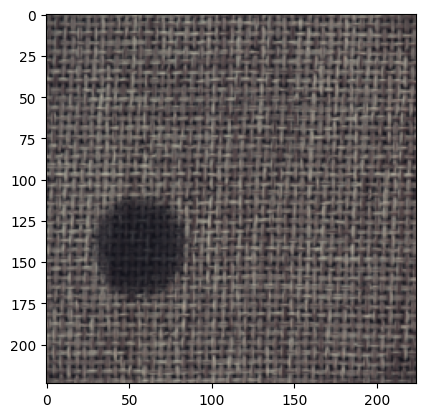

In [ ]:
# (Here it's a carpet dataset test image in PNG format)
image = Image.open('/content/data/carpet/test/color/000.png')

# Apply preprocessing transformations (resize, normalize, etc.)
image = transform(image).unsqueeze(0)

# Initialize the ResNet feature extractor defined earlier
backbone = resnet_feature_extractor()

# Forward pass the image through the backbone to extract features
feature = backbone(image)

# Print the shape of feature maps from layer2 and layer3 of ResNet
print(backbone.features[0].shape)   # Feature map after ResNet layer2
print(backbone.features[1].shape)   # Feature map after ResNet layer3

# Print the shape of the final concatenated + resized patch features
print(feature.shape)

# Visualize the original input image (convert from CHW -> HWC for plotting)
plt.imshow(image[0].permute(1,2,0))

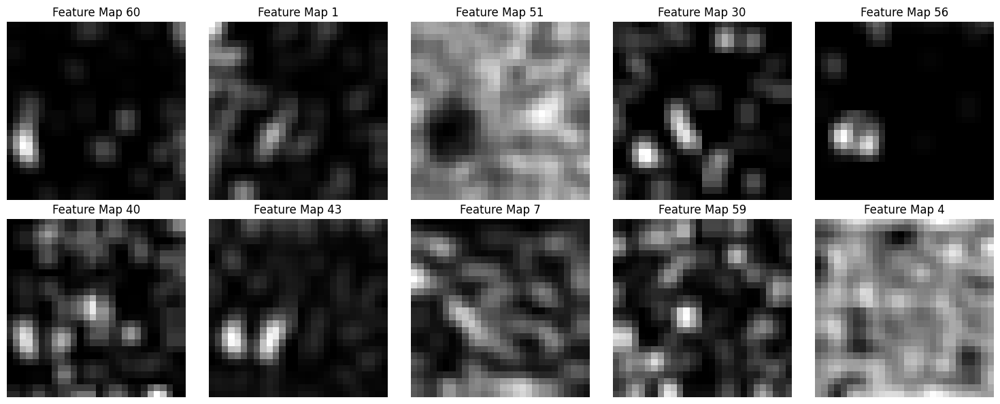

In [ ]:
# Randomly shuffle indices from the first 64 feature maps (channel dimension) and pick 10 of them for visualization
indices = torch.randperm(64)[:10]

# Create a grid of 2 rows × 5 columns (to plot 10 feature maps)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

# Loop through each of the 10 chosen indices
for i, idx in enumerate(indices):
    # Compute subplot position (row, column)
    row = i // 5     # integer division → gives row index
    col = i % 5      # modulo → gives column index

    # Plot the feature map corresponding to 'idx'
    axes[row, col].imshow(feature[0, idx].detach().cpu(), cmap='gray')

    # Add a title showing which feature map is being visualized
    axes[row, col].set_title(f'Feature Map {idx}')

    # Remove axis ticks for cleaner visualization
    axes[row, col].axis('off')

# Adjust spacing so that plots do not overlap
plt.tight_layout()

# Display the final grid of feature maps
plt.show()


In [ ]:
## The autoencoder with resnet backbone model
import torch.nn as nn

class FeatCAE(nn.Module):
    """Autoencoder."""

    def __init__(self, in_channels=1000, latent_dim=50, is_bn=True):
        super(FeatCAE, self).__init__()

        layers = []
        layers += [nn.Conv2d(in_channels, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, latent_dim, kernel_size=1, stride=1, padding=0)]

        self.encoder = nn.Sequential(*layers)

        # if 1x1 conv to reconstruct the rgb values, we try to learn a linear combination
        # of the features for rgb
        layers = []
        layers += [nn.Conv2d(latent_dim, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, in_channels, kernel_size=1, stride=1, padding=0)]
        # layers += [nn.ReLU()]

        self.decoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [ ]:
# model = FeatCAE(in_channels=1536, latent_dim=100)
model = FeatCAE(in_channels=1536, latent_dim=100).cuda()
backbone.cuda()
# Define loss function and optimizer
criterion = torch.nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
ckpoints = torch.load('/content/autoencoder_with_resnet_deep_features.pth')
model.load_state_dict(ckpoints)

model.eval()

FeatCAE(
  (encoder): Sequential(
    (0): Conv2d(1536, 868, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(868, 200, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(200, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  (decoder): Sequential(
    (0): Conv2d(100, 200, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(200, 868, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(868, 1536, kernel_size=(1, 1), stride=(1, 1))
  )
)

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/50], Loss: 0.0155, Validation Loss: 0.0229
Epoch [6/50], Loss: 0.0092, Validation Loss: 0.0093
Epoch [11/50], Loss: 0.0086, Validation Loss: 0.0092
Epoch [16/50], Loss: 0.0082, Validation Loss: 0.0087
Epoch [21/50], Loss: 0.0080, Validation Loss: 0.0084
Epoch [26/50], Loss: 0.0082, Validation Loss: 0.0084
Epoch [31/50], Loss: 0.0076, Validation Loss: 0.0082
Epoch [36/50], Loss: 0.0075, Validation Loss: 0.0078
Epoch [41/50], Loss: 0.0074, Validation Loss: 0.0078
Epoch [46/50], Loss: 0.0072, Validation Loss: 0.0077


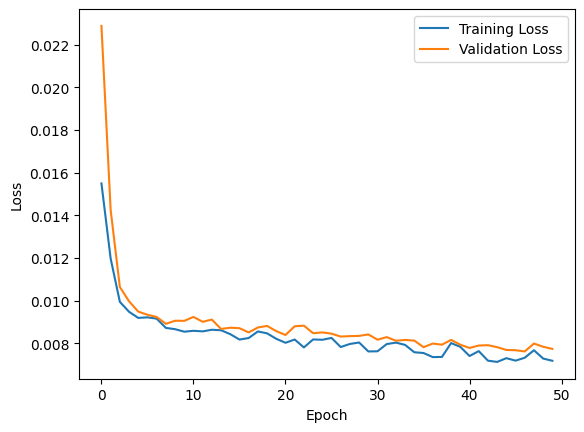

In [ ]:
# Define a list to store training loss and validation loss
Loss = []
Validation_Loss = []


num_epochs = 50
for epoch in tqdm(range(num_epochs)):
    model.train()
    for data,_ in train_loader:
        with torch.no_grad():
            features = backbone(data.cuda())
        # Forward pass
        output = model(features)
        # Compute the loss
        loss = criterion(output, features)
        # Backpropagation and optimization step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    Loss.append(loss.item())

    # Calculate validation loss
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():
        val_loss_sum = 0.0
        num_batches = 0
        for data, _ in test_loader:
            features = backbone(data.cuda())
            output = model(features)
            val_loss = criterion(output, features)
            val_loss_sum += val_loss.item()
            num_batches += 1
        val_loss_avg = val_loss_sum / num_batches
        Validation_Loss.append(val_loss_avg)

    if epoch % 5 == 0:
        print('Epoch [{}/{}], Loss: {:.4f}, Validation Loss: {:.4f}'.format(epoch + 1, num_epochs, loss.item(), val_loss_avg))

plt.plot(Loss, label='Training Loss')
plt.plot(Validation_Loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
# plt.show()

In [ ]:
torch.save(model.state_dict(), '/content/autoencoder_with_resnet_deep_features.pth')

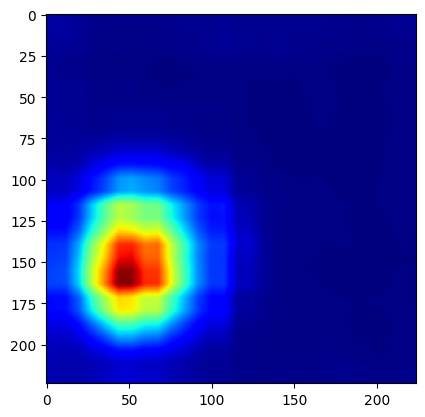

In [ ]:
## Prediction of heatmap
image = Image.open('/content/data/carpet/test/color/000.png')
image = transform(image).unsqueeze(0)

with torch.no_grad():
    features = backbone(image.cuda())
    # features = backbone(image)
    recon = model(features)

recon_error =  ((features-recon)**2).mean(axis=(1)).unsqueeze(0)

segm_map = torch.nn.functional.interpolate(     # Upscale by bi-linaer interpolation to match the original input resolution
                recon_error,
                size=(224, 224),
                mode='bilinear'
            )

plt.imshow(segm_map.squeeze().cpu().numpy(), cmap='jet')
plt.show()

In [ ]:
## For OK images
def decision_function(segm_map):

    mean_top_10_values = []

    for map in segm_map:
        # Flatten the tensor
        flattened_tensor = map.reshape(-1)

        # Sort the flattened tensor along the feature dimension (descending order)
        sorted_tensor, _ = torch.sort(flattened_tensor,descending=True)

        # Take the top 10 values along the feature dimension
        mean_top_10_value = sorted_tensor[:10].mean()

        mean_top_10_values.append(mean_top_10_value)

    return torch.stack(mean_top_10_values)

In [ ]:
model.eval()

RECON_ERROR=[]
for data,_ in train_loader:

    with torch.no_grad():
        features = backbone(data.cuda()).squeeze()
        # features = backbone(data).squeeze()
        # Forward pass
        recon = model(features)
    # Compute the loss
    segm_map =  ((features-recon)**2).mean(axis=(1))[:,3:-3,3:-3]
    anomaly_score = decision_function(segm_map)
    # anomaly_score = segm_map.mean(axis=(1,2))

    RECON_ERROR.append(anomaly_score)

RECON_ERROR = torch.cat(RECON_ERROR).cpu().numpy()

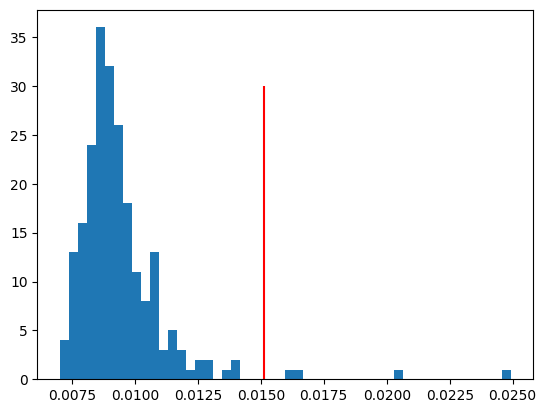

In [ ]:
best_threshold = np.mean(RECON_ERROR) + 3 * np.std(RECON_ERROR)

heat_map_max, heat_map_min = np.max(RECON_ERROR), np.min(RECON_ERROR)

plt.hist(RECON_ERROR,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

In [ ]:
## For Test Images
y_true=[]
y_pred=[]
y_score=[]

model.eval()
backbone.eval()

test_path = Path('/content/data/carpet/test')

for path in test_path.glob('*/*.png'):
    fault_type = path.parts[-2]
    test_image = transform(Image.open(path)).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        # Forward pass
        recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))[:,3:-3,3:-3]
    y_score_image = decision_function(segm_map=segm_map)
    # y_score_image = segm_map.mean(axis=(1,2))

    y_pred_image = 1*(y_score_image >= best_threshold)

    y_true_image = 0 if fault_type == 'good' else 1

    y_true.append(y_true_image)
    y_pred.append(y_pred_image.cpu().numpy())
    y_score.append(y_score_image.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)


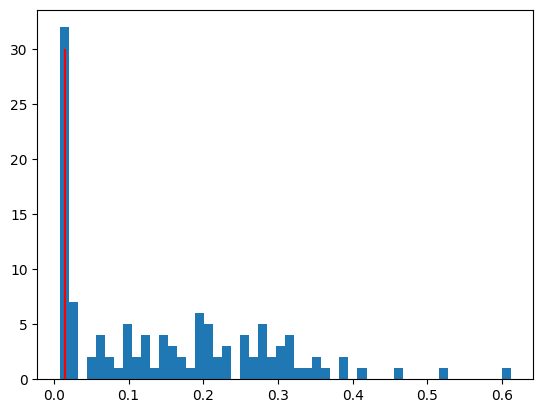

In [ ]:
plt.hist(y_score,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

AUC-ROC Score: 0.9855537720706259


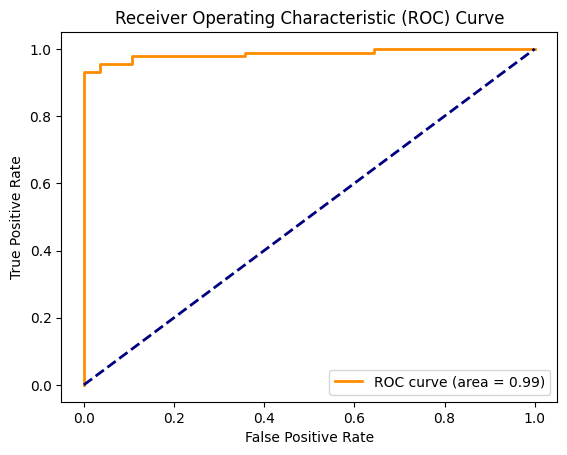

best_threshold = 0.018496254459023476


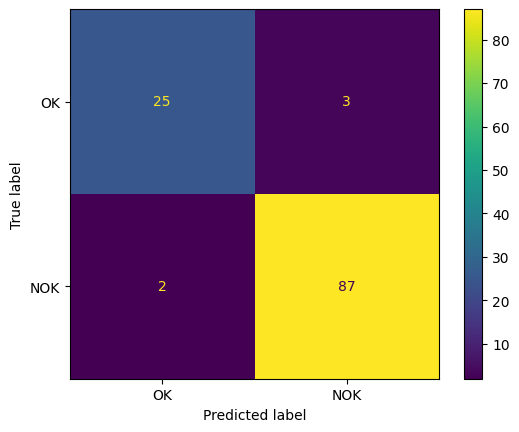

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, f1_score
import seaborn as sns



# Calculate AUC-ROC score
auc_roc_score = roc_auc_score(y_true, y_score)
print("AUC-ROC Score:", auc_roc_score)

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_score)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc_score)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()



f1_scores = [f1_score(y_true, y_score >= threshold) for threshold in thresholds]

# Select the best threshold based on F1 score
best_threshold = thresholds[np.argmax(f1_scores)]

print(f'best_threshold = {best_threshold}')

# Generate confusion matrix
cm = confusion_matrix(y_true, (y_score >= best_threshold).astype(int))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['OK','NOK'])
disp.plot()
plt.show()

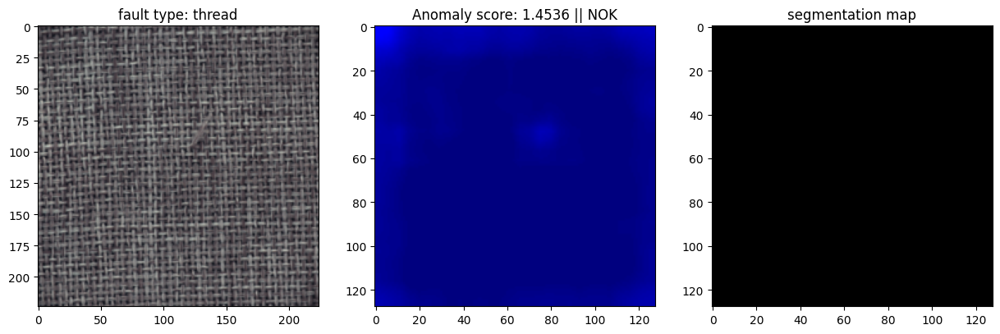

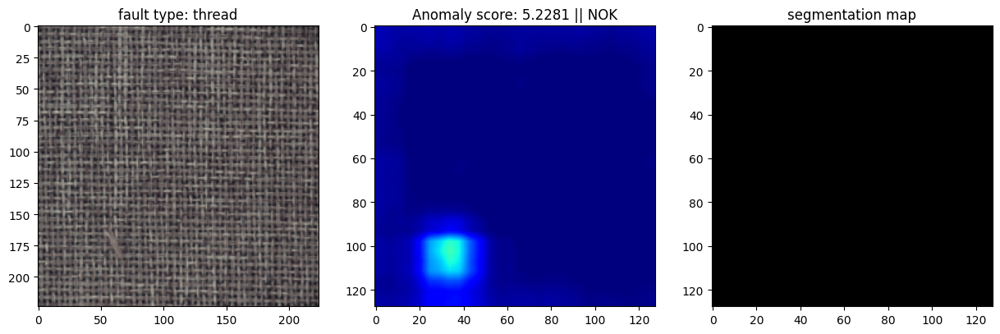

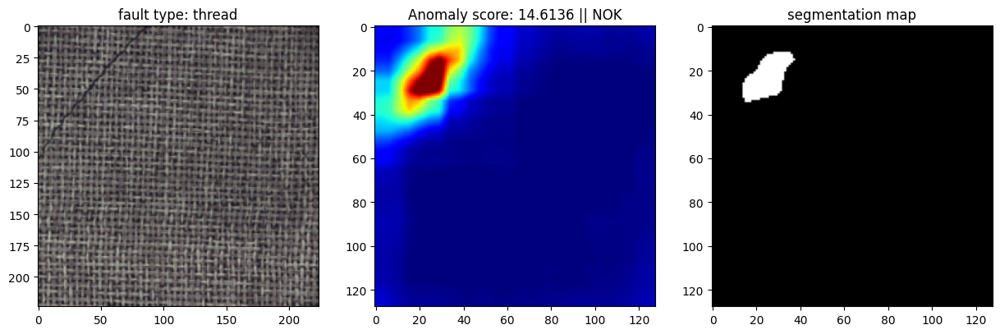

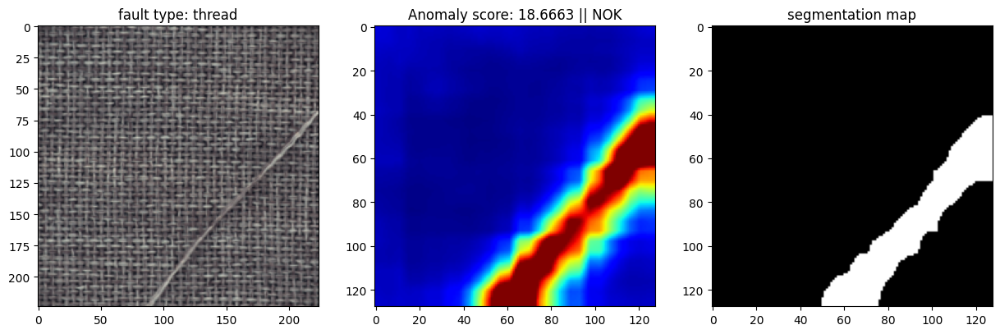

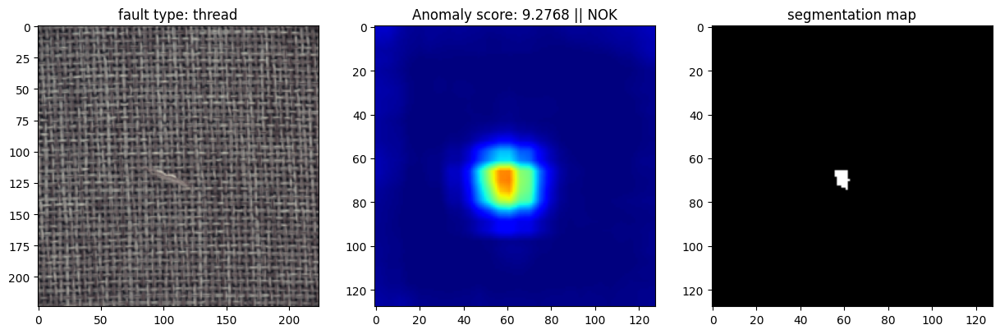

...

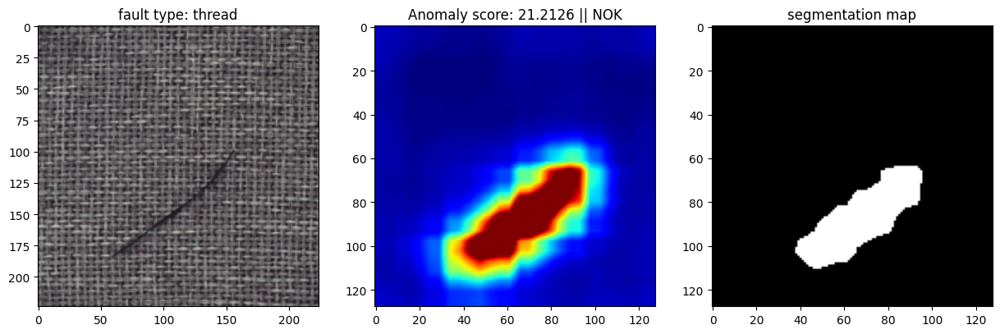

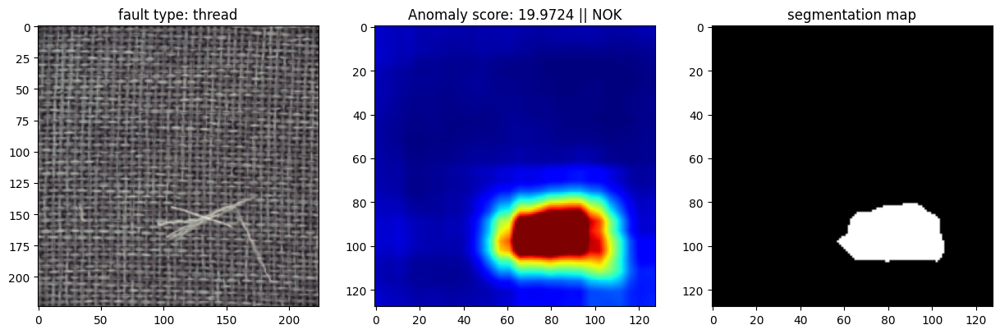

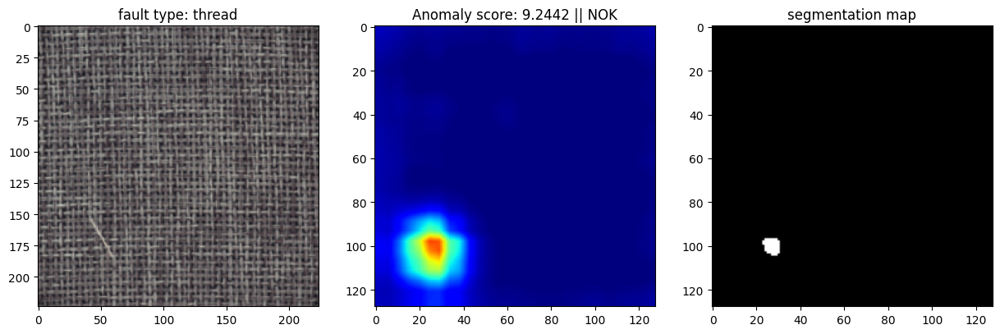

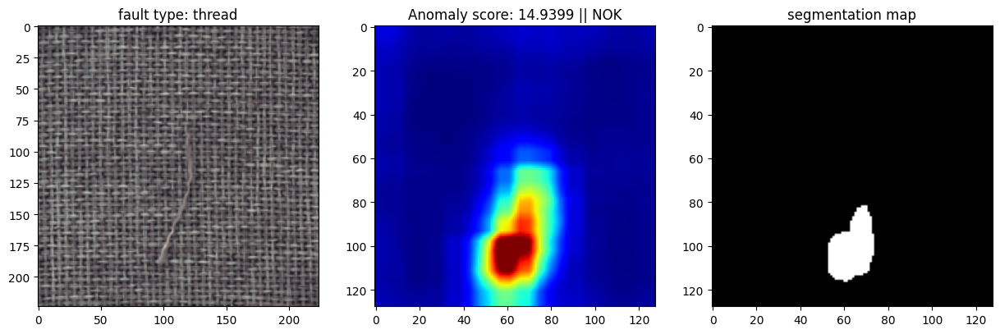

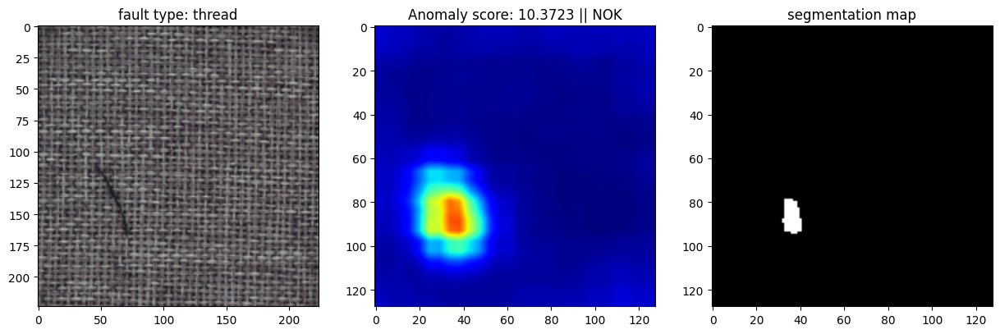

In [ ]:
## Printout the prediction on the test set
import cv2, time
from IPython.display import clear_output

model.eval()
backbone.eval()

test_path = Path('/content/data/carpet/test')

for path in test_path.glob('*/*.png'):
    fault_type = path.parts[-2]
    test_image = transform(Image.open(path)).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        # Forward pass
        recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))
    y_score_image = decision_function(segm_map=segm_map)
    # y_score_image = segm_map.mean(axis=(1,2))

    y_pred_image = 1*(y_score_image >= best_threshold)
    class_label = ['OK','NOK']

    if fault_type in ['thread']:

        plt.figure(figsize=(15,5))

        plt.subplot(1,3,1)
        plt.imshow(test_image.squeeze().permute(1,2,0).cpu().numpy())
        plt.title(f'fault type: {fault_type}')

        plt.subplot(1,3,2)
        heat_map = segm_map.squeeze().cpu().numpy()
        heat_map = heat_map
        heat_map = cv2.resize(heat_map, (128,128))
        plt.imshow(heat_map, cmap='jet', vmin=heat_map_min, vmax=heat_map_max*10) # Here I am cheating by multiplying by 10 (obtained using trail error)
        plt.title(f'Anomaly score: {y_score_image[0].cpu().numpy() / best_threshold:0.4f} || {class_label[y_pred_image]}')

        plt.subplot(1,3,3)
        plt.imshow((heat_map > best_threshold * 10), cmap='gray')
        plt.title(f'segmentation map')

        plt.show()

In [ ]:
# PatchCore Approach
## Create memory bank from 'normal' data
memory_bank =[]

folder_path = Path('/content/data/carpet/train/good')

for pth in tqdm(folder_path.iterdir(),leave=False):

    with torch.no_grad():
        data = transform(Image.open(pth)).cuda().unsqueeze(0)
        features = backbone(data)
        features = features.reshape(features.shape[1], -1).T
        memory_bank.append(features.cpu().detach())

memory_bank = torch.cat(memory_bank,dim=0).cuda()

0it [00:00, ?it/s]

In [ ]:
## Only select 10% of total patches to avoid long inference time and computation
selected_indices = np.random.choice(len(memory_bank), size=len(memory_bank)//10, replace=False)
memory_bank = memory_bank[selected_indices]

In [ ]:
## For OK images [K nearsest neighbours]
y_score=[]
folder_path = Path('/content/data/carpet/train/good')

for pth in tqdm(folder_path.iterdir(),leave=False):
    data = transform(Image.open(pth)).cuda().unsqueeze(0)
    with torch.no_grad():
        features = backbone(data)
        features = features.reshape(features.shape[1], -1).T
    distances = torch.cdist(features, memory_bank, p=2.0)
    dist_score, dist_score_idxs = torch.min(distances, dim=1)
    s_star = torch.max(dist_score)
    segm_map = dist_score.view(1, 1, 28, 28)

    y_score.append(s_star.cpu().numpy())

0it [00:00, ?it/s]

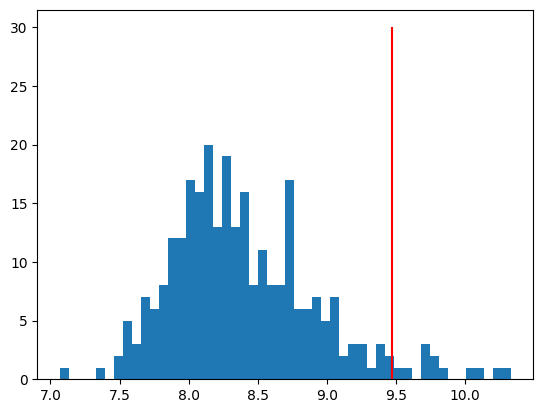

In [ ]:
best_threshold = np.mean(y_score) + 2 * np.std(y_score)

plt.hist(y_score,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

In [ ]:
## For NOK Images
y_score = []
y_true=[]

for classes in ['color','good','cut','hole','metal_contamination','thread']:
    folder_path = Path('/content/data/carpet/test/{}'.format(classes))

    for pth in tqdm(folder_path.iterdir(),leave=False):

        class_label = pth.parts[-2]
        with torch.no_grad():
            test_image = transform(Image.open(pth)).cuda().unsqueeze(0)
            features = backbone(test_image)
            features = features.reshape(features.shape[1], -1).T
        distances = torch.cdist(features, memory_bank, p=2.0)
        dist_score, dist_score_idxs = torch.min(distances, dim=1)
        s_star = torch.max(dist_score)
        segm_map = dist_score.view(1, 1, 28, 28)

        y_score.append(s_star.cpu().numpy())
        y_true.append(0 if class_label == 'good' else 1)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

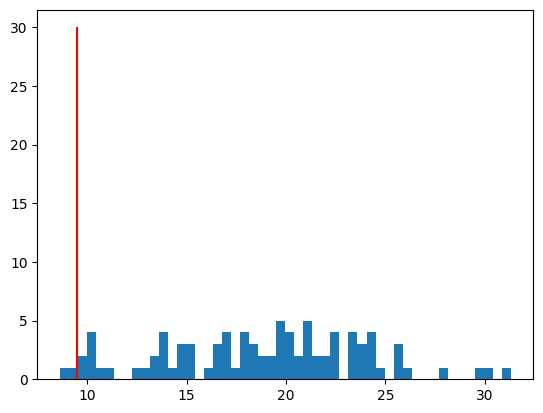

In [ ]:
# plotting the y_score values which do not belong to 'good' class

y_score_nok = [score  for score,true in zip(y_score,y_true) if true==1]
plt.hist(y_score_nok,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

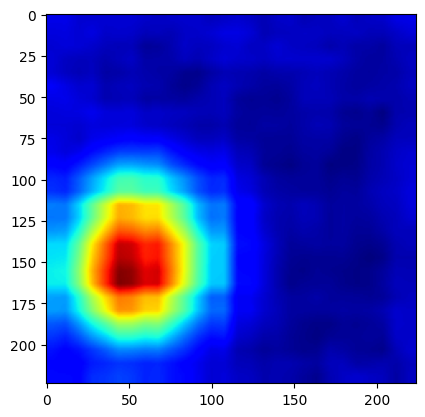

In [ ]:
test_image = transform(Image.open('/content/data/carpet/test/color/000.png')).cuda().unsqueeze(0)
features = backbone(test_image)
features = features.reshape(features.shape[1], -1).T
distances = torch.cdist(features, memory_bank, p=2.0)
dist_score, dist_score_idxs = torch.min(distances, dim=1)
s_star = torch.max(dist_score)
segm_map = dist_score.view(1, 1, 28, 28)

segm_map = torch.nn.functional.interpolate(     # Upscale by bi-linaer interpolation to match the original input resolution
                segm_map,
                size=(224, 224),
                mode='bilinear'
            )

plt.imshow(segm_map.cpu().squeeze(), cmap='jet')

AUC-ROC Score: 0.9739165329052968


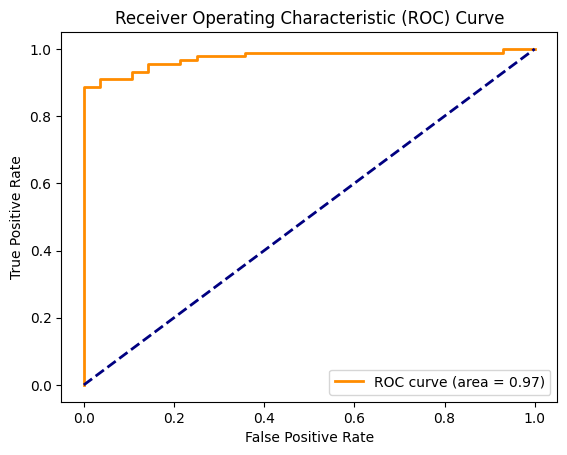

best_threshold = 10.139999389648438


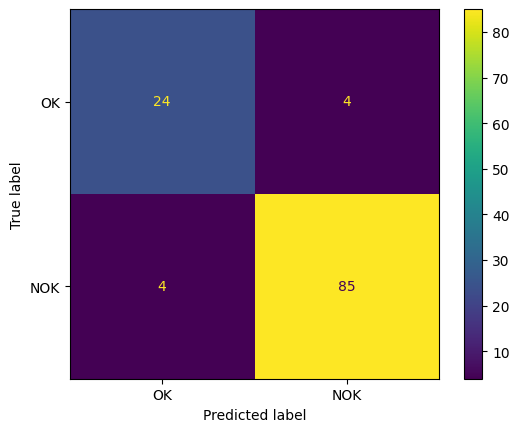

In [ ]:
## Evaluation Matrices
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, f1_score


# Calculate AUC-ROC score
auc_roc_score = roc_auc_score(y_true, y_score)
print("AUC-ROC Score:", auc_roc_score)


# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_score)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc_score)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

f1_scores = [f1_score(y_true, y_score >= threshold) for threshold in thresholds]

# Select the best threshold based on F1 score
best_threshold = thresholds[np.argmax(f1_scores)]

print(f'best_threshold = {best_threshold}')

# Generate confusion matrix
cm = confusion_matrix(y_true, (y_score >= best_threshold).astype(int))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['OK','NOK'])
disp.plot()
plt.show()

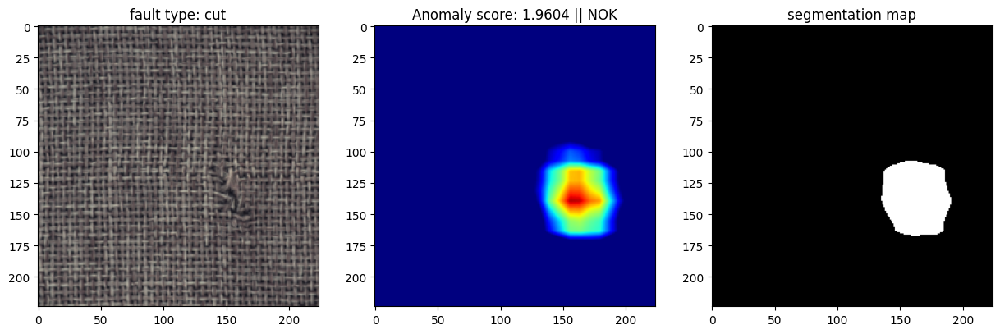

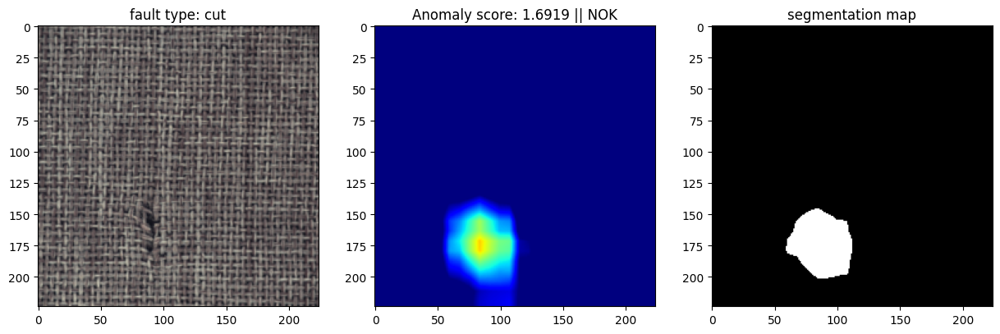

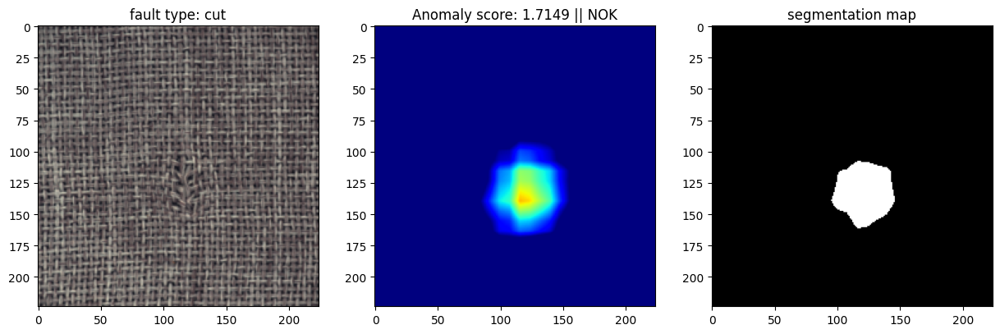

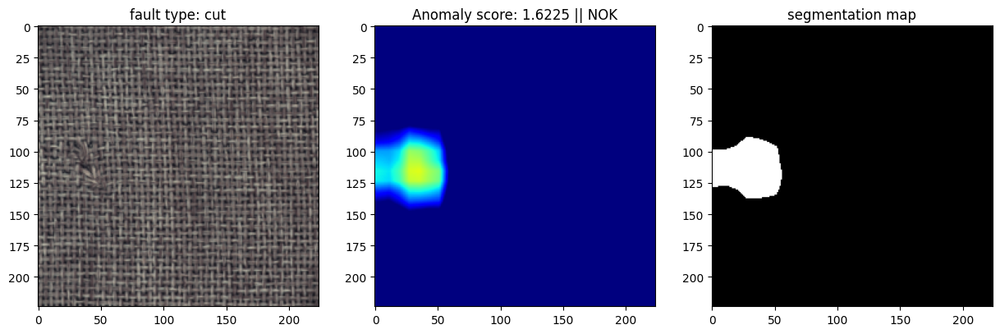

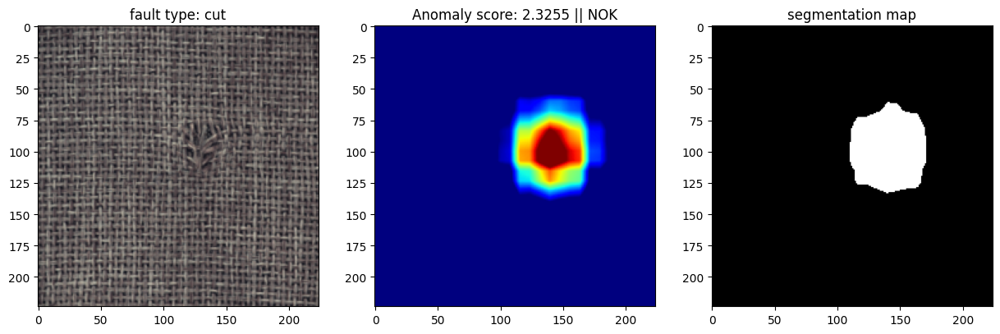

...

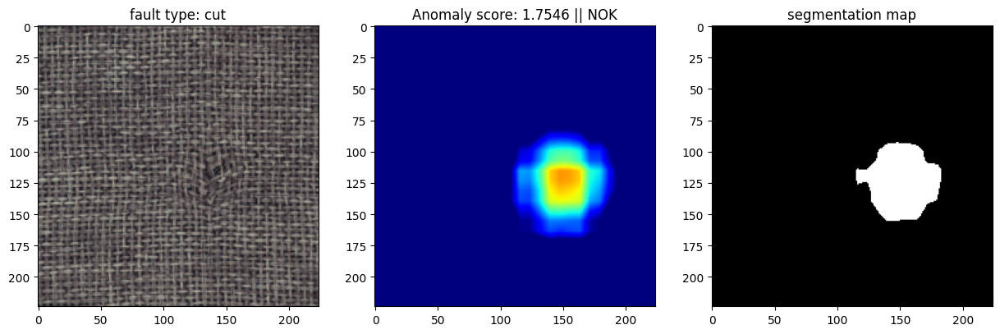

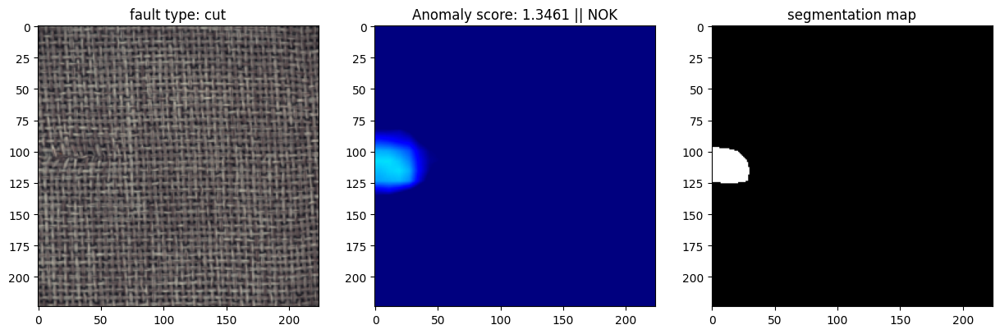

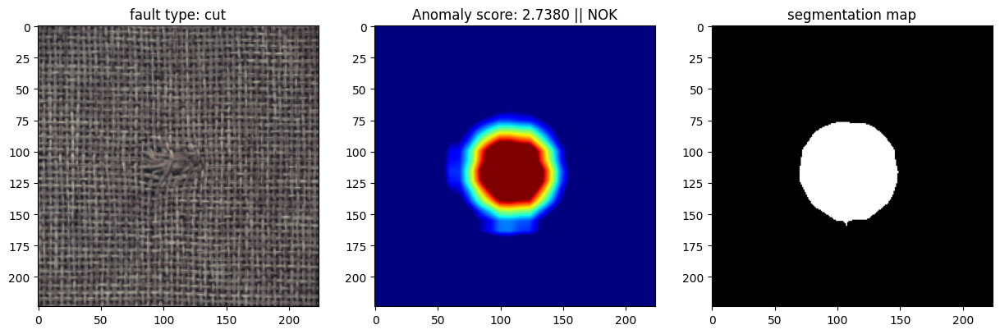

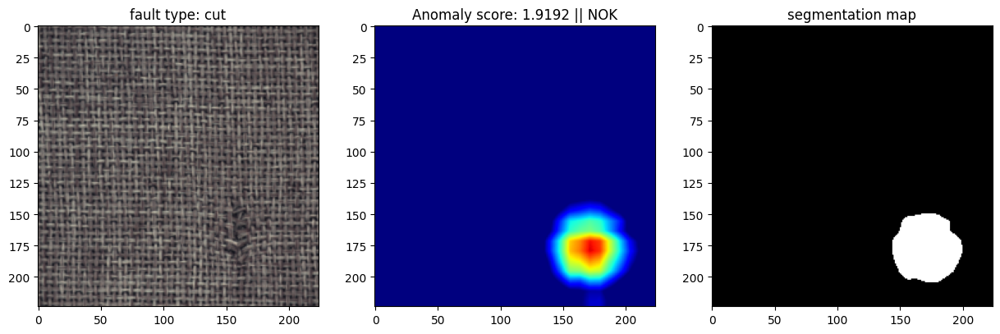

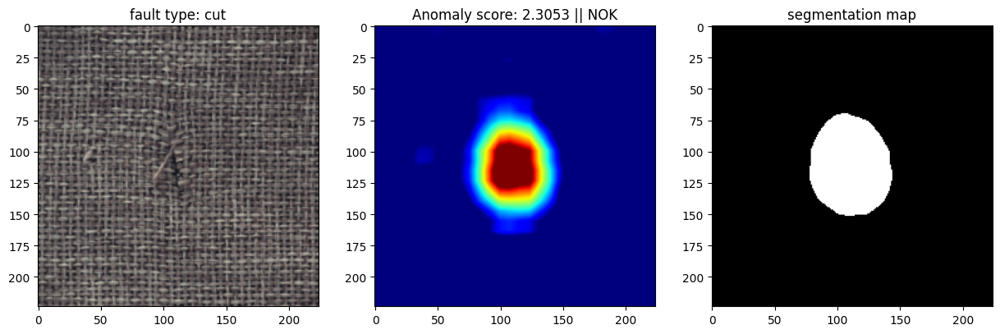

In [ ]:
## Printout the prediction on the test set
import cv2, time
from IPython.display import clear_output

backbone.eval()

test_path = Path('/content/data/carpet/test')

for path in test_path.glob('*/*.png'):

    fault_type = path.parts[-2]

    if fault_type in ['cut']:

        test_image = transform(Image.open(path)).cuda().unsqueeze(0)

        with torch.no_grad():
            features = backbone(test_image)
            features = features.reshape(features.shape[1], -1).T
        # Forward pass
        distances = torch.cdist(features, memory_bank, p=2.0)
        dist_score, dist_score_idxs = torch.min(distances, dim=1)
        s_star = torch.max(dist_score)
        segm_map = dist_score.view(1, 1, 28, 28)
        segm_map = torch.nn.functional.interpolate(     # Upscale by bi-linaer interpolation to match the original input resolution
                    segm_map,
                    size=(224, 224),
                    mode='bilinear'
                ).cpu().squeeze().numpy()

        y_score_image = s_star.cpu().numpy()

        y_pred_image = 1*(y_score_image >= best_threshold)
        class_label = ['OK','NOK']


        plt.figure(figsize=(15,5))

        plt.subplot(1,3,1)
        plt.imshow(test_image.squeeze().permute(1,2,0).cpu().numpy())
        plt.title(f'fault type: {fault_type}')

        plt.subplot(1,3,2)
        heat_map = segm_map
        plt.imshow(heat_map, cmap='jet',vmin=best_threshold, vmax=best_threshold*2)
        plt.title(f'Anomaly score: {y_score_image / best_threshold:0.4f} || {class_label[y_pred_image]}')

        plt.subplot(1,3,3)
        plt.imshow((heat_map > best_threshold*1.25), cmap='gray')
        plt.title(f'segmentation map')

        plt.show()

        # time.sleep(0.05)
        # clear_output(wait=True)
